In [1]:
from ica_benchmark.processing.ica import get_all_methods
import mne
import matplotlib.pyplot as plt
import matplotlib
import numpy as np

%matplotlib inline

# pip install PyQt5
# matplotlib.use("Qt5Agg")
# %matplotlib notebook

In [2]:
def cue_name(cue):
    return {
        0: "Left hand",
        1: "Right hand",
        2: "Foot",
        3: "Tongue",
    }[cue]

In [3]:
from pathlib import Path
from ica_benchmark.io.load import BCI_IV_Comp_Dataset

root = Path("/home/paulo/Documents/datasets/BCI_Comp_IV_2a/gdf/")

subject_number = 4

filepaths = [
    root / "A{}T.gdf".format(str(subject_number).rjust(2, "0"))
]

print("Loading imagery epochs")
epochs = BCI_IV_Comp_Dataset.load_dataset(
    filepaths,
    as_epochs=True,
    concatenate=False,
    drop_bad=True,
    return_metadata=False,
    tmin=3.,
    tmax=6.
)[0]

print("Loading imagery raw")
raw = BCI_IV_Comp_Dataset.load_as_raw(filepaths[0])



Loading imagery epochs
Loading imagery raw


In [4]:
L_FREQ, H_FREQ = (None, 40)
RE_FS = 100

# epochs = epochs.filter(l_freq=L_FREQ, h_freq=H_FREQ).resample(RE_FS);
# raw = raw.filter(l_freq=L_FREQ, h_freq=H_FREQ).resample(RE_FS);

# Documentation says that `resample` method applies a anti-aliasing filter.
# https://mne.tools/dev/overview/faq.html#resampling-and-decimating

epochs = epochs.load_data().resample(RE_FS);
raw = raw.load_data().resample(RE_FS);

# CAR
epochs.set_eeg_reference("average");
raw.set_eeg_reference("average");


In [5]:
epochs

Number of events,231
Events,0: 611: 572: 543: 59
Time range,3.000 – 5.990 sec
Baseline,off


In [6]:
raw

<RawGDF | A04T.gdf, 22 x 240366 (2403.7 s), ~40.4 MB, data loaded>

In [7]:
epochs_cues = epochs.events[:, 2]
cues = np.unique(epochs_cues)
cues_epochs_dict = {
    cue: epochs_cues == cue
    for cue
    in cues
}
list(cues_epochs_dict.keys())

[0, 1, 2, 3]

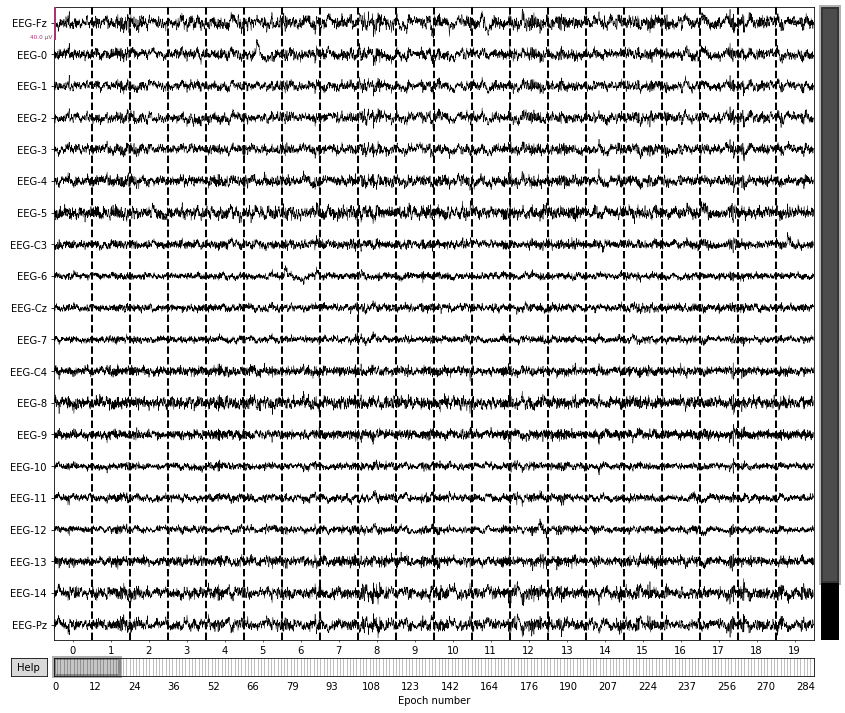

In [8]:
epochs.plot();

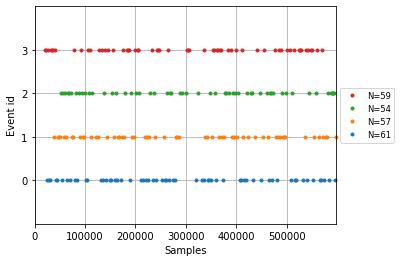

In [9]:
mne.viz.plot_events(epochs.events);

In [10]:
epochs.ch_names

['EEG-Fz',
 'EEG-0',
 'EEG-1',
 'EEG-2',
 'EEG-3',
 'EEG-4',
 'EEG-5',
 'EEG-C3',
 'EEG-6',
 'EEG-Cz',
 'EEG-7',
 'EEG-C4',
 'EEG-8',
 'EEG-9',
 'EEG-10',
 'EEG-11',
 'EEG-12',
 'EEG-13',
 'EEG-14',
 'EEG-Pz',
 'EEG-15',
 'EEG-16']

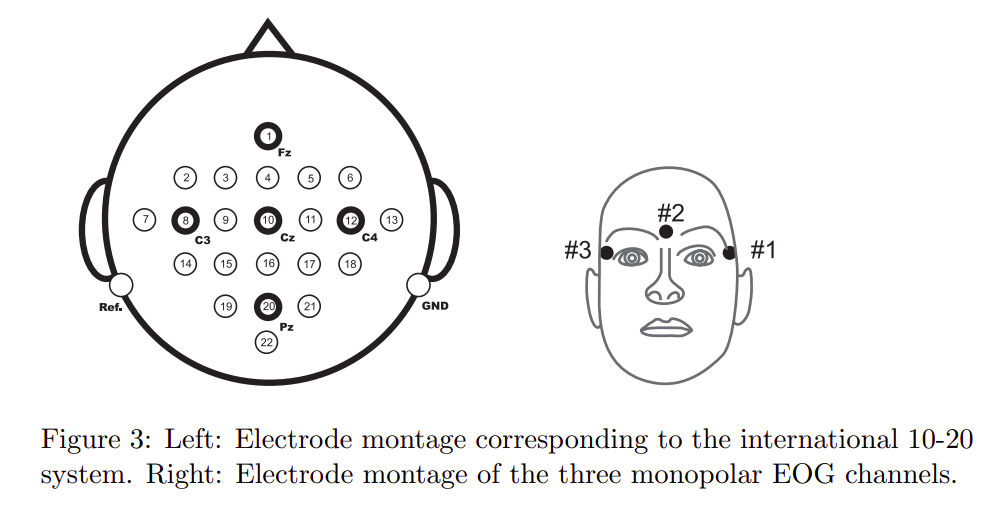

In [11]:
from statsmodels.tsa.stattools import acf


def multi_trial_acf(x, nlags=100):
    autocorr_sequence = 0
    for trial_number in range(len(x)):
        autocorr_sequence += acf(x[trial_number], nlags=nlags)
    return autocorr_sequence / len(x)

## Average auto-correlation sequence between all trials 

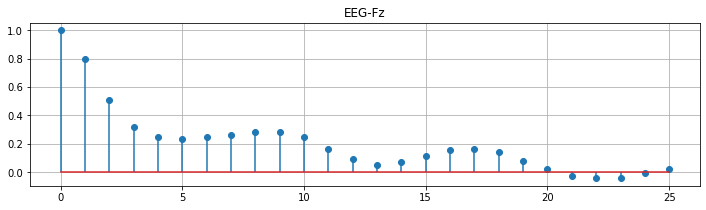

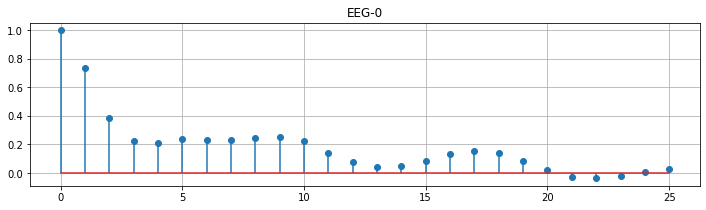

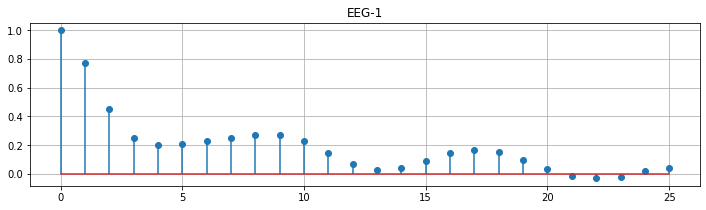

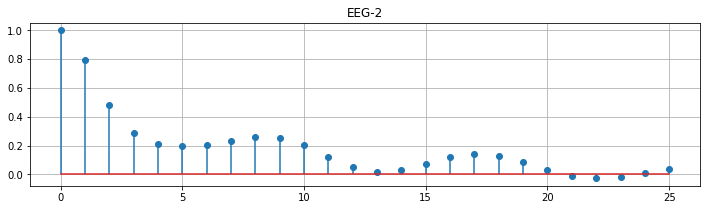

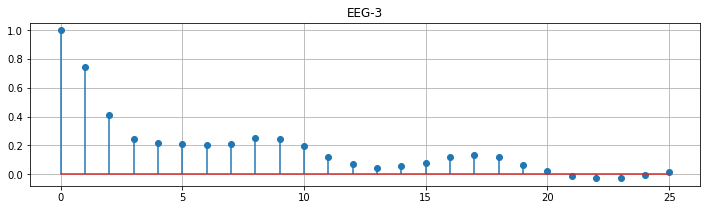

...

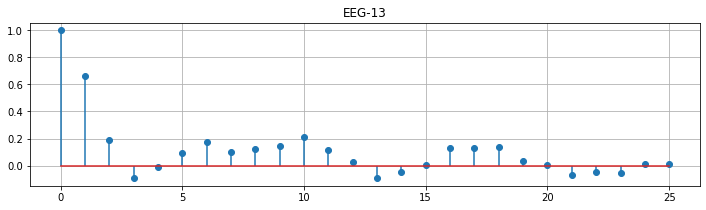

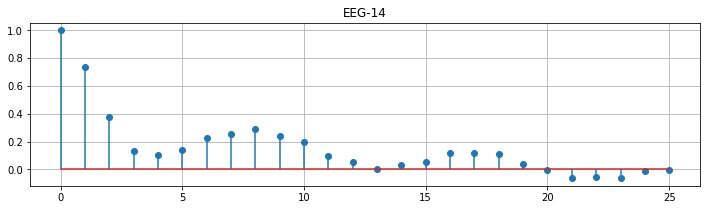

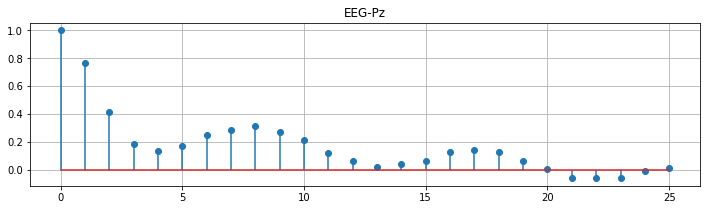

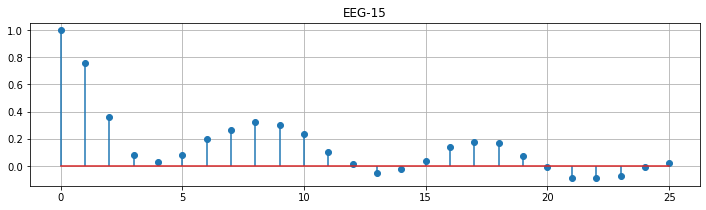

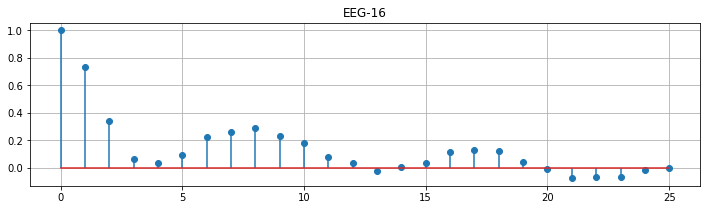

In [12]:
from ica_benchmark.processing.ica import get_ica_instance, get_all_methods

ch_names = epochs.ch_names
for channel in ch_names:
    x = epochs.copy().pick(channel).get_data().squeeze()
    plt.figure(figsize=(12, 3))
    plt.stem(multi_trial_acf(x, nlags=25))
    plt.grid()
    plt.title(channel)
    plt.show()
    

In [13]:
selected_channels = ["EEG-Fz", "EEG-C3", "EEG-C4", "EEG-Pz", "EEG-Cz"]

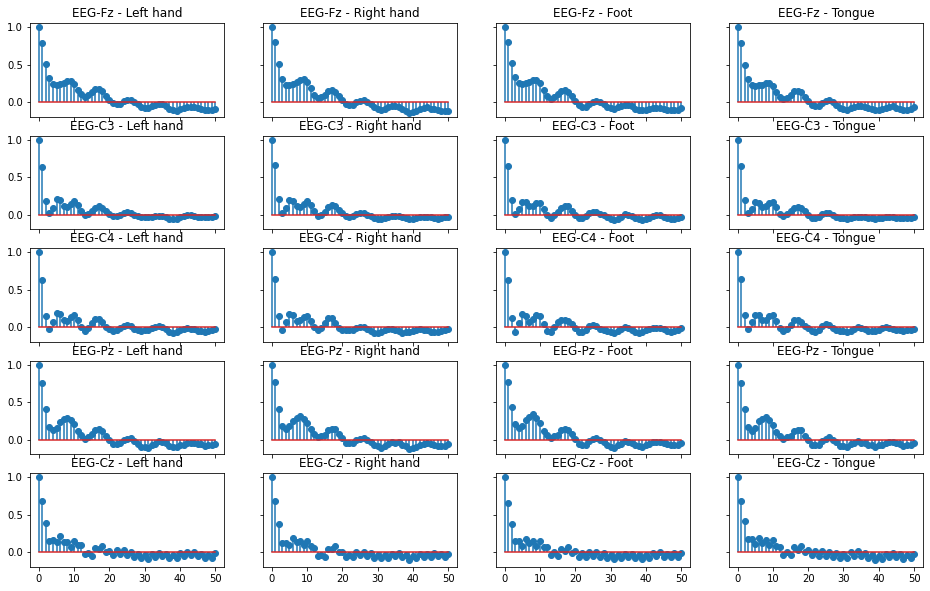

In [14]:
nrows, ncols = len(selected_channels), len(cues), 
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 2), sharey=True, sharex=True)
for col, cue in enumerate(cues):
    for row, channel in enumerate(selected_channels):
        channel_data = epochs.copy().pick(channel).drop(~cues_epochs_dict[cue]).get_data().squeeze()
        autocorr_sequence = multi_trial_acf(
            channel_data,
            nlags=50
        )
        ax = axes[row, col]
        ax.stem(autocorr_sequence)
        ax.grid()
        ax.set_title(f"{channel} - {cue_name(cue)}")
        ax.grid()
plt.show()

In [15]:
from ica_benchmark.processing.ica import get_ica_instance
ICA = get_ica_instance("ext_infomax", n_components=len(ch_names))
ICA.fit(epochs)

source_epochs = ICA.get_sources(epochs)
ica_channels = source_epochs.ch_names

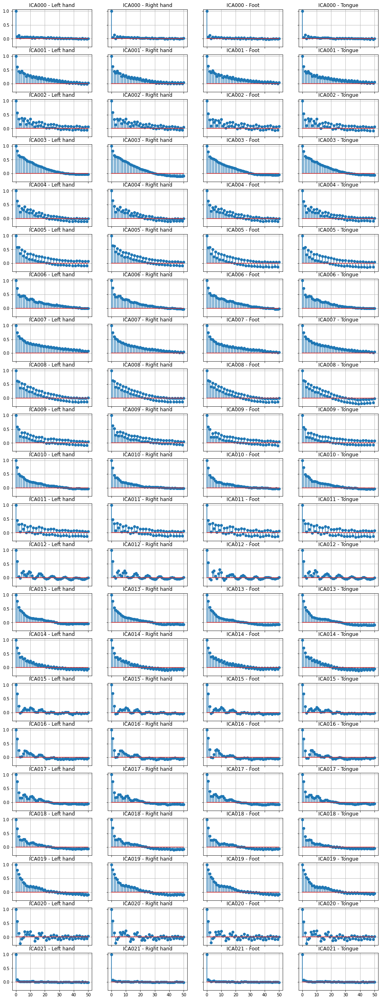

In [16]:
nrows, ncols = len(ica_channels), len(cues), 
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 2), sharey=True, sharex=True)
for col, cue in enumerate(cues):
    for row, channel in enumerate(ica_channels):
        channel_data = source_epochs.copy().pick(channel).drop(~cues_epochs_dict[cue]).get_data().squeeze()
        autocorr_sequence = multi_trial_acf(
            channel_data,
            nlags=50
        )
        ax = axes[row, col]
        ax.stem(autocorr_sequence)
        ax.set_title(f"{channel} - {cue_name(cue)}")
        ax.grid()
plt.show()

In [17]:
def psd_from_epochs(epochs, channel, cue=None, mean=True):
    epochs = epochs.copy().pick(channel)
    if cue is not None:
        epochs = epochs.drop(~cues_epochs_dict[cue])
    psd, freqs = mne.time_frequency.psd_multitaper(
        epochs,
        fmin=0,
        fmax=30,
        tmin=None,
        tmax=None,
        bandwidth=None,
        adaptive=False,
        low_bias=True,
        normalization='length',
        picks=channel,
        proj=False,
        n_jobs=3,
        reject_by_annotation=False,
        verbose=None
    )
    
    psd = psd.squeeze()
    err = None
    if mean:
#         psd = psd.mean(axis=0, keepdims=True)
#         err = psd.std(axis=0, keepdims=True)
        psd = psd.mean(axis=0)
        err = psd.std(axis=0)
    return psd, err, freqs


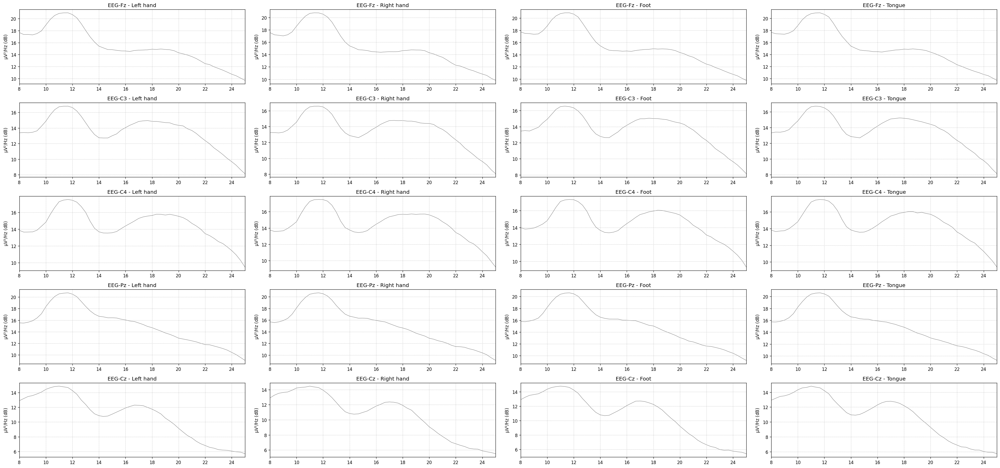

In [18]:
from scipy.signal import find_peaks

nrows, ncols = len(selected_channels), len(cues), 
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 8, nrows * 3), sharey=False, sharex=False, dpi=120)
for col, cue in enumerate(cues):
    for row, channel in enumerate(selected_channels):
        ax = axes[row, col]
        epochs.copy().pick(channel).drop(cues_epochs_dict[cue]).plot_psd(fmin=8, fmax=25, ax=ax, show=False)
        ax.set_title(f"{channel} - {cue_name(cue)}")

plt.tight_layout()
plt.show()

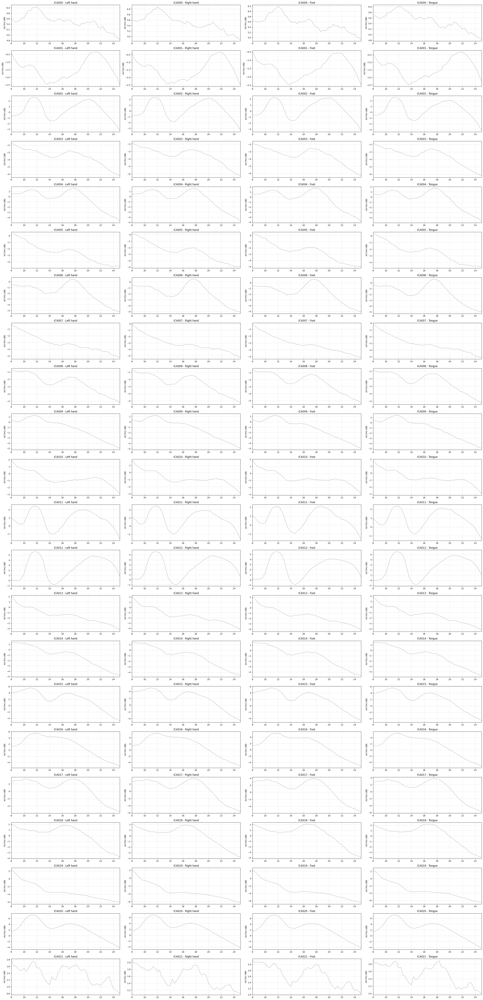

In [19]:
nrows, ncols = len(ica_channels), len(cues), 
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 8, nrows * 3), sharey=False, sharex=False, dpi=100)
for col, cue in enumerate(cues):
    for row, channel in enumerate(ica_channels):
        ax = axes[row, col]
        (
            source_epochs 
                .copy()
                .pick(channel)
                .drop(cues_epochs_dict[cue])
                .plot_psd(fmin=8, fmax=25, ax=ax, show=False, picks="misc")
        )
        ax.set_title(f"{channel} - {cue_name(cue)}")

plt.tight_layout()
plt.show()

In [20]:
full_epochs = BCI_IV_Comp_Dataset.load_dataset(
    filepaths,
    as_epochs=True,
    concatenate=False,
    drop_bad=True,
    return_metadata=False,
    tmin=-2.,
    tmax=6.
)[0]

# If data is not loaded source_full_epochs wont know the right number 
# of epochs because bad epochs will not be dropped yet
full_epochs = full_epochs.load_data().resample(RE_FS);
full_epochs.set_eeg_reference("average");

ICA = get_ica_instance("ext_infomax", n_components=len(ch_names))
ICA.fit(epochs)

source_full_epochs = ICA.get_sources(full_epochs)
ica_full_channels = source_full_epochs.ch_names 

# Needed for TFR calculations (dont know why)
source_full_epochs.set_channel_types(
    {
        channel: "eeg"
        for channel in ica_full_channels
    }
)


Number of events,219
Events,0: 521: 552: 543: 58
Time range,-2.000 – 5.990 sec
Baseline,off


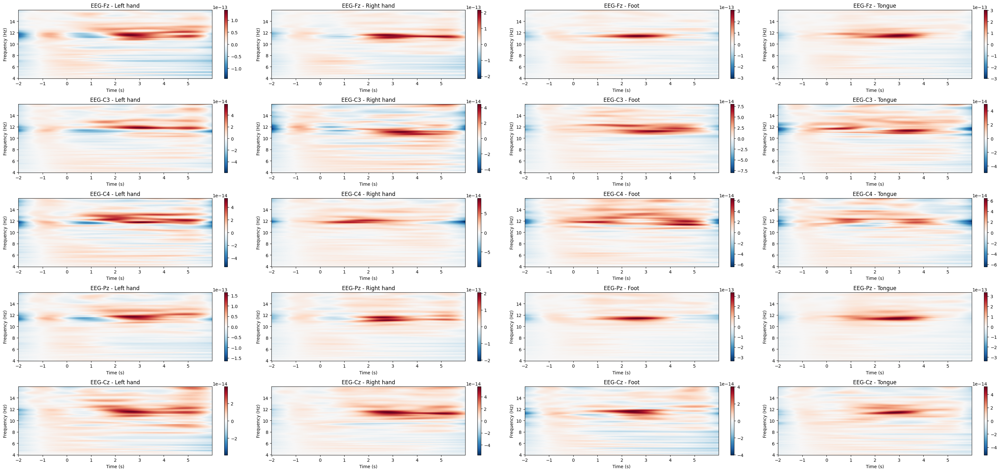

In [21]:
tfr_estimator = "stockwell"

lfreq, hfreq = 4, 16
freqs = np.linspace(lfreq, hfreq, (hfreq - lfreq) * 2 + 1)

nrows, ncols = len(selected_channels), len(cues), 
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 8, nrows * 3), sharey=False, sharex=False, dpi=100)
for col, cue in enumerate(cues):

    if tfr_estimator == "stockwell":
        power = mne.time_frequency.tfr_stockwell(
            full_epochs.copy().drop(~(full_epochs.events[:, 2] == cue)),
            fmin=freqs[0],
            fmax=freqs[-1],
            n_jobs=3,
            width=1
        )
    elif tfr_estimator == "morlet":
        time_smoothing_window = 1 / 2
        n_cycles = freqs * time_smoothing_window #

        power = mne.time_frequency.tfr_morlet(
            full_epochs.copy().drop(~(full_epochs.events[:, 2] == cue)),
            freqs,
            n_cycles=n_cycles,
            n_jobs=3,
            return_itc=False
        )
    elif tfr_estimator == "multitaper":
        time_smoothing_window = 1 / 2
        n_cycles = freqs * time_smoothing_window # Time window is n_cycles / freqs
        # freq_smoothing_8hz = n_cycles[0] *
        time_bandwidth = 4.0  # Same time-smoothing as (1), 7 tapers.

        power = mne.time_frequency.tfr_multitaper(
            full_epochs.copy().drop(~(full_epochs.events[:, 2] == cue)),
            time_bandwidth=time_bandwidth,
            freqs=freqs,
            n_cycles=n_cycles,
            n_jobs=3,
            return_itc=False,
            average=True
        )
    
    for row, channel in enumerate(selected_channels):

        ax = axes[row, col]
        power.plot(
            picks=channel,
            axes=ax,
            show=False,
            mode="mean",
            baseline=(-2, 0)
        )
        ax.set_title(f"{channel} - {cue_name(cue)}")

plt.tight_layout()
plt.show()

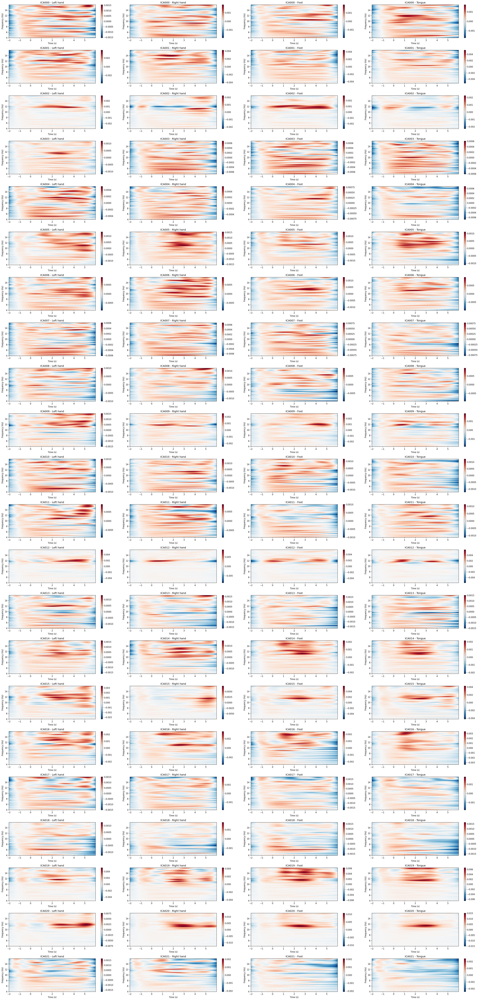

In [22]:
tfr_estimator = "stockwell"

lfreq, hfreq = 4, 16
freqs = np.linspace(lfreq, hfreq, (hfreq - lfreq) * 2 + 1)

nrows, ncols = len(ica_full_channels), len(cues), 
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 8, nrows * 3), sharey=False, sharex=False, dpi=120)
for col, cue in enumerate(cues):
    if tfr_estimator == "stockwell":
        power = mne.time_frequency.tfr_stockwell(
            source_full_epochs.copy().drop(~(source_full_epochs.events[:, 2] == cue)),
            fmin=freqs[0],
            fmax=freqs[-1],
            n_jobs=3,
            width=1
        )
    elif tfr_estimator == "morlet":
        time_smoothing_window = 1 / 2
        n_cycles = freqs * time_smoothing_window #

        power = mne.time_frequency.tfr_morlet(
            source_full_epochs.copy().drop(~(source_full_epochs.events[:, 2] == cue)),
            freqs,
            n_cycles=n_cycles,
            n_jobs=3,
            return_itc=False
        )
    elif tfr_estimator == "multitaper":
        time_smoothing_window = 1 / 2
        n_cycles = freqs * time_smoothing_window # Time window is n_cycles / freqs
        # freq_smoothing_8hz = n_cycles[0] *
        time_bandwidth = 4.0  # Same time-smoothing as (1), 7 tapers.

        power = mne.time_frequency.tfr_multitaper(
            source_full_epochs.copy().drop(~(source_full_epochs.events[:, 2] == cue)),
            time_bandwidth=time_bandwidth,
            freqs=freqs,
            n_cycles=n_cycles,
            n_jobs=3,
            return_itc=False,
            average=True
        )
    for row, channel in enumerate(ica_full_channels):
        ax = axes[row, col]
        power.plot(
            picks=channel,
            axes=ax,
            show=False,
            mode="mean",
            baseline=(-2, 0)
        )
        ax.set_title(f"{channel} - {cue_name(cue)}")

plt.tight_layout()
plt.show()

<ipython-input-48-d99c0583ce35>:55: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


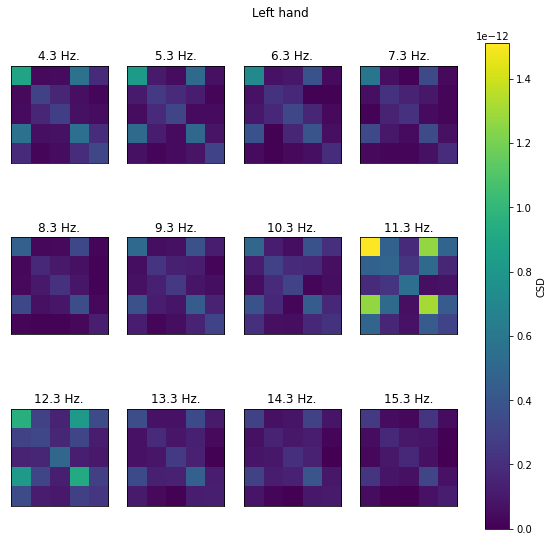

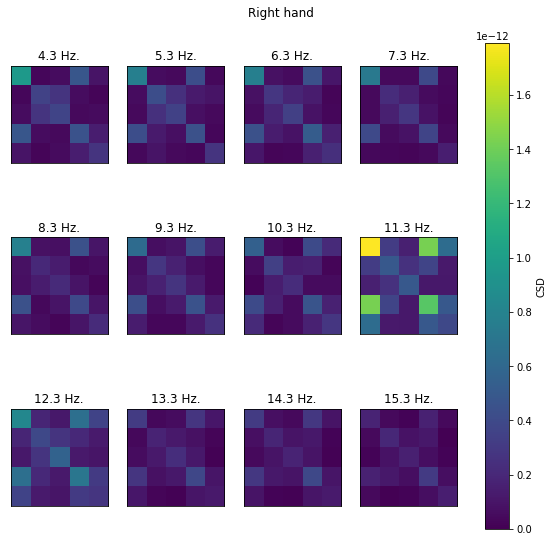

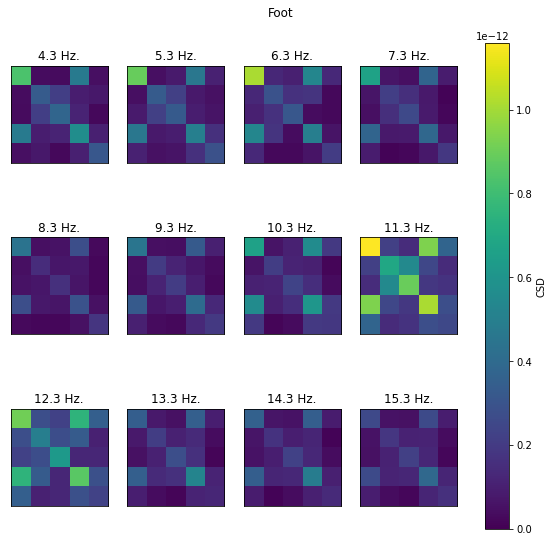

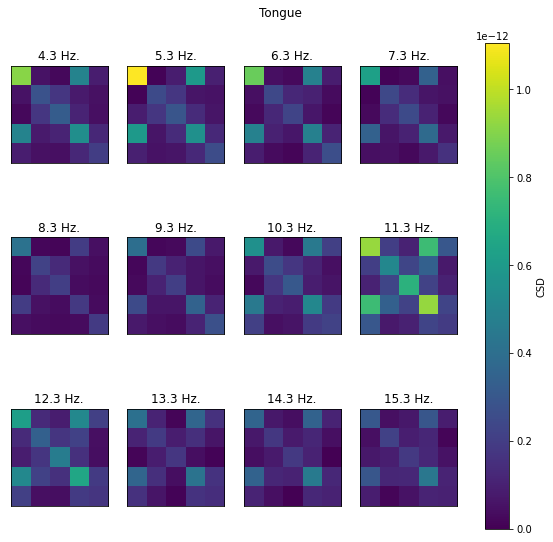

In [48]:
csd_method = "fourier"

FMIN = 4
FMAX = 16

csd_kwargs = dict(
    fmin=FMIN,
    fmax=FMAX,
    tmin=3,
    tmax=6,
)

freqs = np.linspace(FMIN, FMAX, (FMAX - FMIN) * 2 + 1)

for cue in cues:
    if csd_method == "multitaper":
        csd = mne.time_frequency.csd_multitaper(
            epochs.copy().load_data().drop(~(epochs.events[:, 2] == cue)),
            picks=selected_channels,
            bandwidth=1,
            n_jobs=2,
            verbose=None,
            ** csd_kwargs
        )
        csd = csd[::3]
    elif csd_method == "fourier":
        csd = mne.time_frequency.csd_fourier(
            epochs.copy().load_data().drop(~(epochs.events[:, 2] == cue)),
            picks=selected_channels,
            n_jobs=2,
            verbose=None,
            ** csd_kwargs
        )
        csd = csd[::3]
    elif csd_method == "morlet":
        time_smoothing_window = 1
        n_cycles = freqs * time_smoothing_window

        csd = mne.time_frequency.csd_morlet(
            epochs.copy().load_data().drop(~(epochs.events[:, 2] == cue)),
            freqs,#16 - 6 + 1),
            picks=selected_channels,
            n_cycles=n_cycles,
            use_fft=True,
            projs=None,
            n_jobs=2,
            verbose=None
        )
    fig = csd.plot(
        mode="csd",
        show=False
    )[0]
    fig.set_size_inches(10, 10)
    fig.suptitle(cue_name(cue), y=.85)
    fig.show()

In [77]:
cbar = fig.axes[-1]
help(cbar.csd)

Help on method csd in module matplotlib.axes._axes:

csd(x, y, NFFT=None, Fs=None, Fc=None, detrend=None, window=None, noverlap=None, pad_to=None, sides=None, scale_by_freq=None, return_line=None, *, data=None, **kwargs) method of matplotlib.axes._axes.Axes instance
    Plot the cross-spectral density.
    
    The cross spectral density :math:`P_{xy}` by Welch's average
    periodogram method.  The vectors *x* and *y* are divided into
    *NFFT* length segments.  Each segment is detrended by function
    *detrend* and windowed by function *window*.  *noverlap* gives
    the length of the overlap between segments.  The product of
    the direct FFTs of *x* and *y* are averaged over each segment
    to compute :math:`P_{xy}`, with a scaling to correct for power
    loss due to windowing.
    
    If len(*x*) < *NFFT* or len(*y*) < *NFFT*, they will be zero
    padded to *NFFT*.
    
    Parameters
    ----------
    x, y : 1-D arrays or sequences
        Arrays or sequences containing t

<ipython-input-37-8eeddf1b9078>:24: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


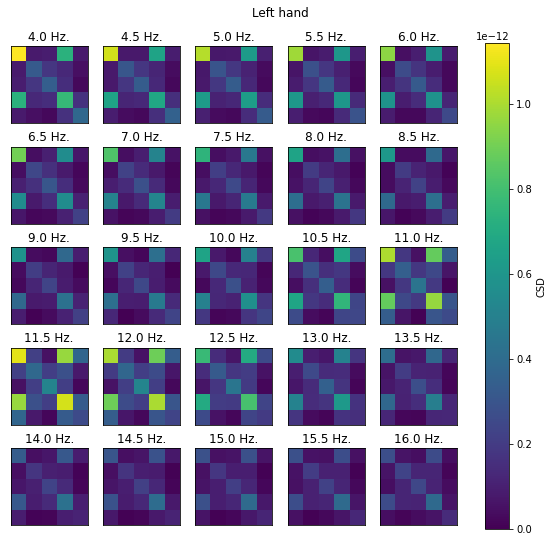

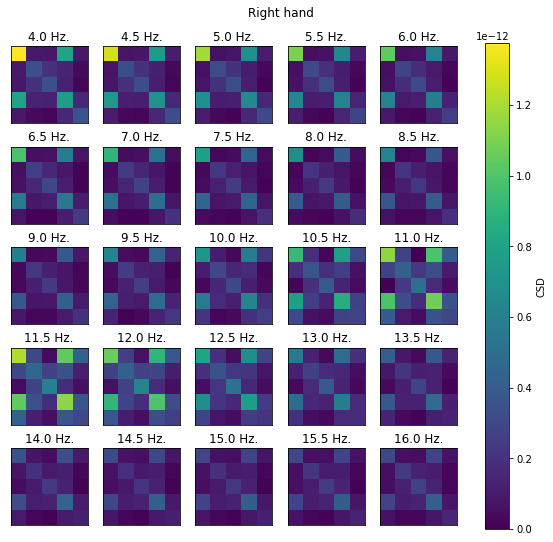

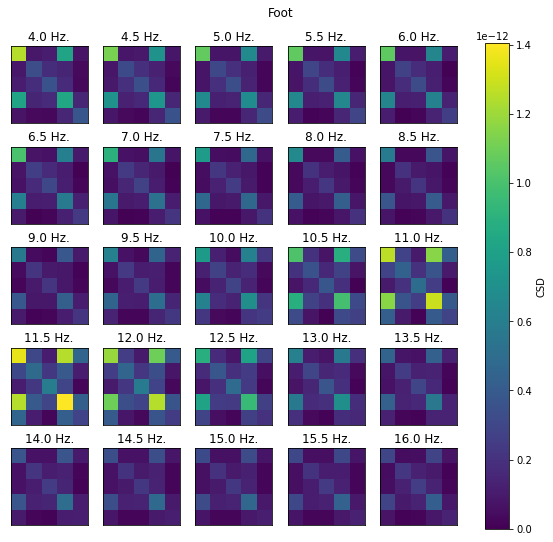

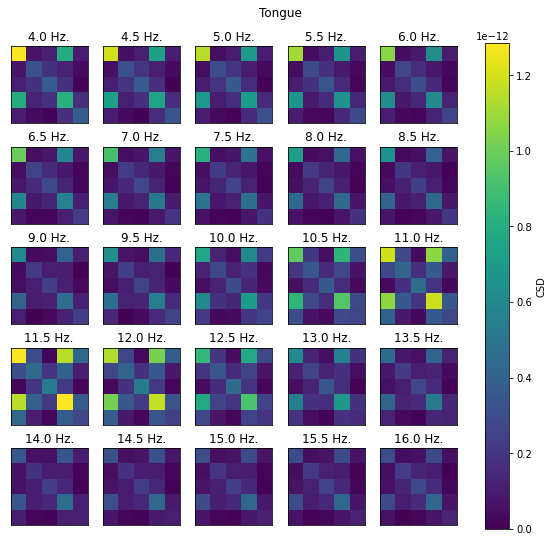

In [37]:
freqs = np.linspace(4, 16, (16 - 4) * 2 + 1)
time_smoothing_window = 1
n_cycles = freqs * time_smoothing_window

for cue in cues:
    csd = mne.time_frequency.csd_morlet(
        epochs.copy().load_data().drop(~(epochs.events[:, 2] == cue)),
        freqs,#16 - 6 + 1),
        picks=selected_channels,
        n_cycles=n_cycles,
        use_fft=True,
        decim=1,
        projs=None,
        n_jobs=2,
        verbose=None
    )

    fig = csd.plot(
        mode="csd",
        show=False
    )[0]
    fig.set_size_inches(10, 10)
    fig.suptitle(cue_name(cue), y=.85)
    fig.show()

<ipython-input-34-f3109b162bf6>:19: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


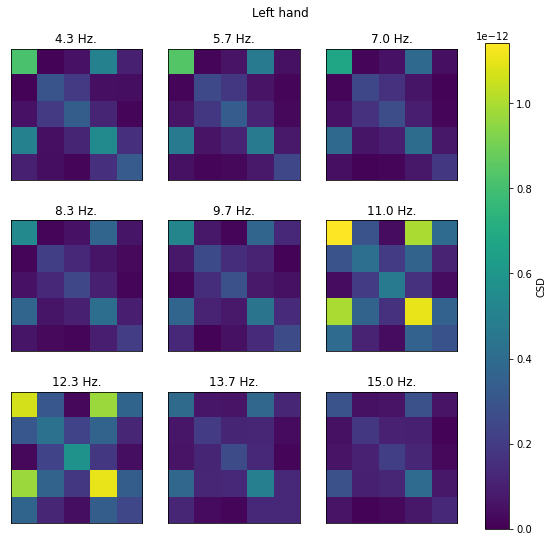

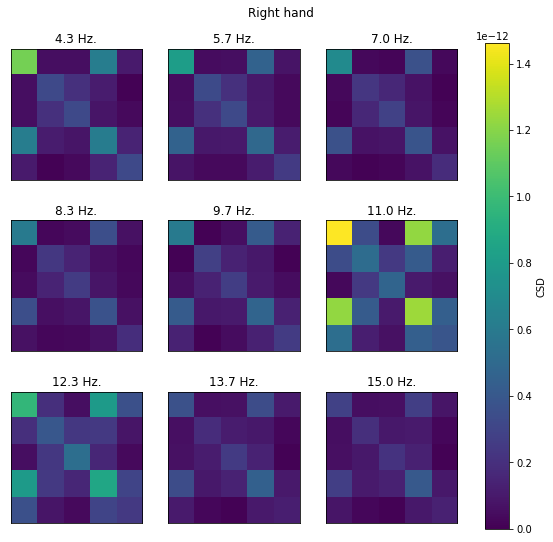

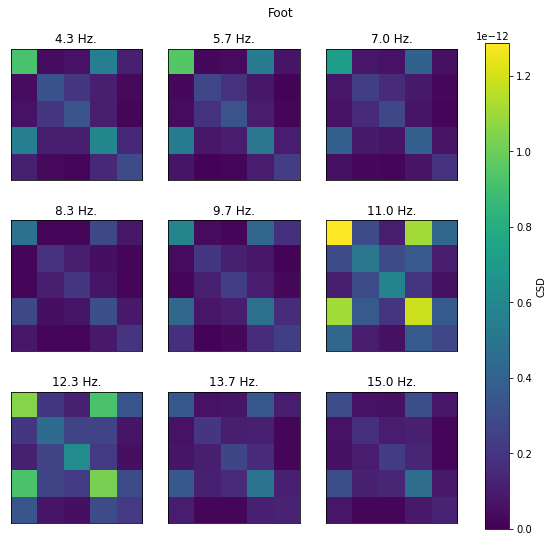

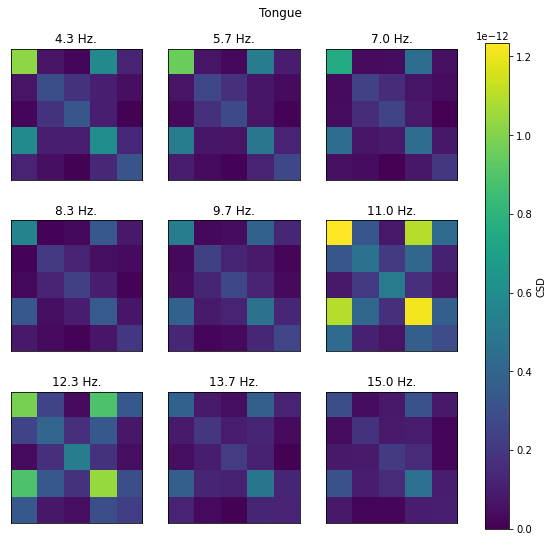

In [34]:

for cue in cues:
    csd = mne.time_frequency.csd_multitaper(
        full_epochs.copy().load_data().drop(~(full_epochs.events[:, 2] == cue)),
        picks=selected_channels,
        bandwidth=2,
        n_jobs=2,
        verbose=None,
        ** csd_kwargs
    )

    fig = csd[::4].plot(
        mode="csd",
        show=False
    )[0]
    fig.set_size_inches(10, 10)
    fig.suptitle(cue_name(cue), y=.85)
    fig.show()

<ipython-input-35-29046b448cfe>:16: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


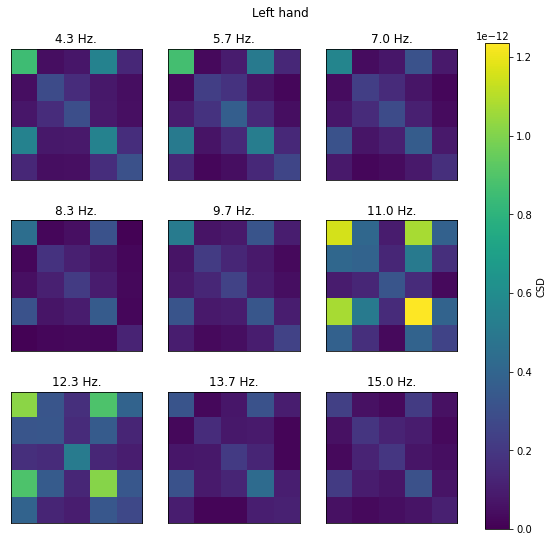

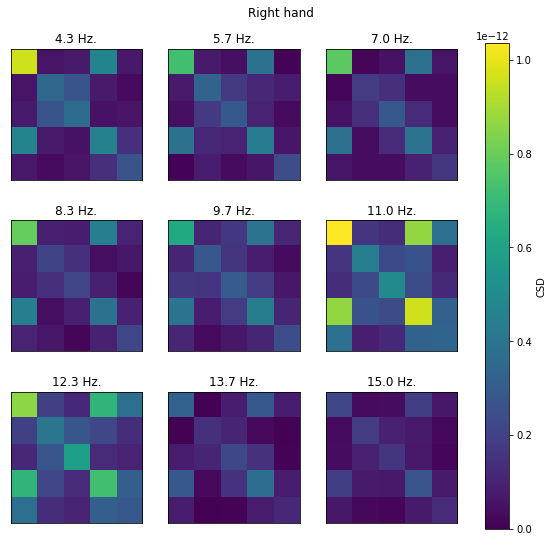

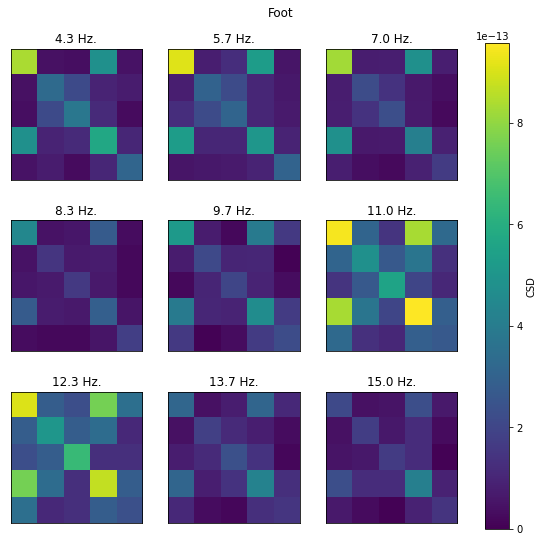

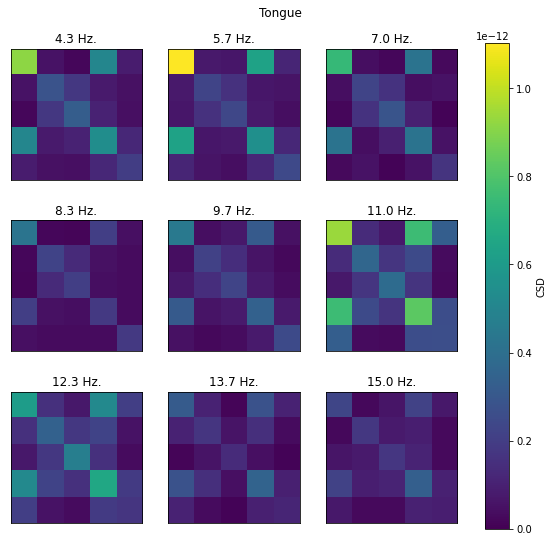

In [35]:
for cue in cues:
    csd = mne.time_frequency.csd_fourier(
        full_epochs.copy().load_data().drop(~(full_epochs.events[:, 2] == cue)),
        picks=selected_channels,
        n_jobs=2,
        verbose=None,
        ** csd_kwargs
    )

    fig = csd[::4].plot(
        mode="csd",
        show=False
    )[0]
    fig.set_size_inches(10, 10)
    fig.suptitle(cue_name(cue), y=.85)
    fig.show()

In [26]:
selected_channels

['EEG-Fz', 'EEG-C3', 'EEG-C4', 'EEG-Pz', 'EEG-Cz']

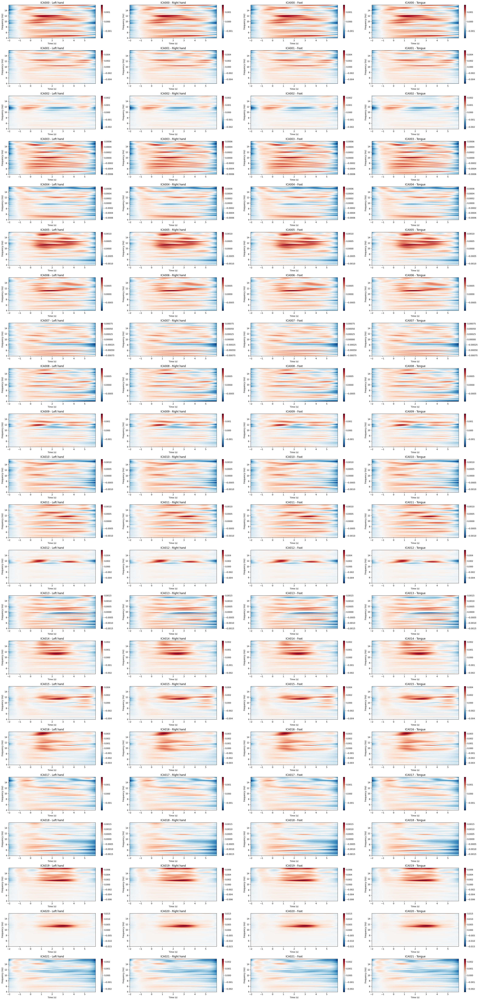

In [27]:
tfr_estimator = "stockwell"

lfreq, hfreq = 6, 25
freqs = np.linspace(lfreq, hfreq, (hfreq - lfreq + 1) * 2)
time_smoothing_window = 1

nrows, ncols = len(ica_full_channels), len(cues), 
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 8, nrows * 3), sharey=False, sharex=False, dpi=100)
for col, cue in enumerate(cues):
    csd = mne.time_frequency.csd_morlet(
        full_epochs.copy().load_data(),
        freqs,
        picks=selected_channels,
        n_cycles=freqs * time_smoothing_window ,
        use_fft=True,
        decim=1,
        projs=None,
        n_jobs=2,
        verbose=None
    )
    for row, channel in enumerate(ica_full_channels):
        ax = axes[row, col]
        power.plot(
            picks=channel,
            axes=ax,
            show=False,
            mode="mean",
            baseline=(-2, 0)
        )
        ax.set_title(f"{channel} - {cue_name(cue)}")

plt.tight_layout()
plt.show()

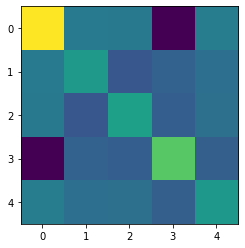

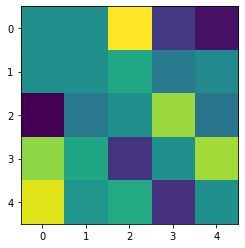

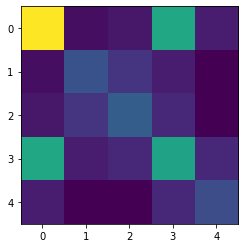

In [28]:


plt.figure()
plt.imshow(csd[0].get_data().real)

plt.figure()
plt.imshow(csd[0].get_data().imag)

plt.figure()
plt.imshow(np.abs(csd[0].get_data()))


NameError: name 'plots_cue_stems' is not defined

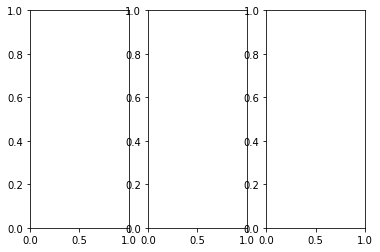

In [29]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KernelDensity

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as grid_spec

data = pd.read_csv("/home/paulo/Downloads/mock-european-test-results.csv")

colors = ['#0000ff', '#3300cc', '#660099', '#990066', '#cc0033', '#ff0000']




def plot_cue_stems(data_list, title="", title_list=None, orig_ax=None):
    if orig_ax is None:
        fig = plt.figure(figsize=(16, 9))
        gs = grid_spec.GridSpec(len(cues), 1)
    else:
        divider = make_axes_locatable(orig_ax)            
        
    for i, cue in enumerate(cues):
        if orig_ax is None:
            ax = fig.add_subplot(gs[i:i+1, 0:])
        else:
            if i == 0:
                ax = orig_ax
                ax.set_title(title)
            else:
                ax = divider.new_vertical(size="100%", pad=0.1, pack_start=True)
                orig_ax.get_figure().add_axes(ax)

        ax.stem(data_list[i])
        ax.set_ylim(-0.3, 1)

        rect = ax.patch
        rect.set_alpha(0)

        ax.set_yticklabels([])
        
        ax.grid()
        
        if i == len(cues) - 1:
            ax.set_xlabel("Lag", fontsize=16,fontweight="bold")
        else:
            ax.set_xticklabels([])

        spines = ["top","right","left","bottom"]
        for s in spines:
            ax.spines[s].set_visible(False)
        
        if title_list is not None:
            ax.text(-0.2, 0, cue_to_name(cue), fontweight="bold", fontsize=14, ha="right")
#             ax.text(-0.2, 0, title_list[i], fontweight="bold", fontsize=14, ha="right")

    if orig_ax is None:
        gs.update(hspace=-.0)
    
    
    fig.text(0.5, 1, "Cross-correlation coefficients", fontsize=20, horizontalalignment="center")
    
#     plt.tight_layout()
#     plt.show()
    
fig, axes = plt.subplots(1, 3)
plots_cue_stems(
    ([1,2,3],
    [1,2,3],
    [1,2,3],
    [1,2,3]),
    title_list=[1, 2, 3, 4],
    orig_ax=axes[2]
)

In [ ]:
from statsmodels.tsa.stattools import ccf

L_FREQ, H_FREQ = (None, 40)
RE_FS = 100

def multi_trial_ccf(x, y, nlags=100):
    crosscorr_sequence = 0
    assert len(x) == len(y)
    
    for trial_number in range(len(x)):
        crosscorr_sequence += ccf(x[trial_number], y[trial_number])
    return crosscorr_sequence[:nlags] / len(x)

def multi_person_ccf(x_list, nlags=100):
    crosscorr_sequence = 0
    for x in x_list:
        crosscorr_sequence += multi_trial_ccf(x, nlags=nlags)
    return crosscorr_sequence

def multi_person_ccf_from_epochs(epochs, channel_a, channel_b, cue=None, nlags=100):
    crosscorr_sequence = 0
    for epoch in epochs:
        loaded_epochs = epoch.copy().load_data().filter(l_freq=L_FREQ, h_freq=H_FREQ).resample(RE_FS)
        if cue is not None:
            assert cue in np.unique(loaded_epochs.events[:, 2])
            loaded_epochs = loaded_epochs.drop(loaded_epochs.events[:, 2] != cue)
        
        data_a = loaded_epochs.copy().pick(channel_a).get_data().squeeze()
        data_b = loaded_epochs.copy().pick(channel_b).get_data().squeeze()
        
        crosscorr_sequence += multi_trial_ccf(
            data_a,
            data_b,
            nlags=nlags
        )
    return crosscorr_sequence


In [ ]:
n_channels = len(selected_channels)
for e_idx, epochs in enumerate(imagery_epochs_list):
    fig, axes = plt.subplots(n_channels, n_channels, figsize=(4 * n_channels, 6 * n_channels), dpi=100)
    sequences = list()
    for row, channel_1 in enumerate(selected_channels):
        for col, channel_2 in enumerate(selected_channels):
            if row > col:
                axes[row, col].axis(False)
                continue
            for cue in cues:
                e = (
                    epochs \
                    .copy() \
                    .drop(epochs.events[:, 2] != cue)
                    .load_data() \
                    .filter(l_freq=L_FREQ, h_freq=H_FREQ) \
                    .resample(RE_FS) \
                )
                s1 = e.pick(channel_1).get_data().squeeze()
                s2 = e.pick(channel_1).get_data().squeeze()
                crosscorr_sequence = multi_trial_ccf(s1, s2, nlags=50)
                sequences.append(crosscorr_sequence)

            ax = axes[row, col]
            plot_cue_stems(
                sequences,
                orig_ax=ax,
                title="[A{}]: {} x {}".format(
                    e_idx,
                    channel_1,
                    channel_2
                )
            )
    plt.show()

In [ ]:
x.shape

In [ ]:
n = 1000000

Lasso(fit_intercept=False).fit(
    x, y
)


In [ ]:
data.shape

In [ ]:
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.metrics import r2_score, mean_squared_error

data = imagery_epochs_list[1].copy().get_data()
ch_names = imagery_epochs_list[0].ch_names
models = dict()
filtered_signals = dict()
for c_idx in range(22):
    x_channels = list(range(22))
    x_channels.remove(c_idx)
#     olr = Lasso(fit_intercept=False, alpha=1e-10)
    olr = LinearRegression(fit_intercept=False)
    x = data[:, x_channels, :]
    y = data[:, [c_idx], :]
    x = x.transpose(1, 0, 2).reshape(21, -1).T
    y = y.transpose(1, 0, 2).reshape(1, -1).T
    olr.fit(x, y)
    pred = olr.predict(x).reshape(-1, 1)
    models[c_idx] = olr
    filtered_signals[c_idx] = y - pred
    print(ch_names[c_idx], r2_score(pred, y), mean_squared_error(pred, y))

for i in range(22):
    m = models[i]
    plt.figure(figsize=(16, 4))
    plt.title(ch_names[i])
    coefs = list(m.coef_.flatten())
    coefs = coefs[:i] + [0] + coefs[i:]
    plt.stem(ch_names, coefs)
    plt.xticks(range(23), rotation=45)
    plt.show()
    f = filtered_signals[i][:751]
    s = data[0, i, :]
    plt.figure(figsize=(16, 4))
    plt.title([f.std(), s.std()])
    plt.plot(f, label="Filtered")
    plt.plot(s, label="Signal")
#     plt.ylim(-5, 5)
    plt.show()


In [ ]:
e = imagery_epochs_list[1]
# mne.get_montage_volume_labels(e)
mne.channels.make_1020_channel_selections(e.info)

In [ ]:
e2.set
mne.create_info(
    [str(i) for i in range(22)],
    e2.info["sfreq"]
)

In [ ]:
e2.info

In [ ]:
y.shape, pred.shape

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

data = imagery_sources_epochs_list[0].copy().get_data()
ch_names = imagery_sources_epochs_list[0].ch_names
models = dict()
filtered_signals = dict()
for c_idx in range(22):
    
    x_channels = list(range(22))
    x_channels.remove(c_idx)
    olr = LinearRegression(fit_intercept=False)
    x = data[:, x_channels, :]
    y = data[:, [c_idx], :]
    x = x.transpose(1, 0, 2).reshape(21, -1).T
    y = y.transpose(1, 0, 2).reshape(1, -1).T
    olr.fit(x, y)
    pred = olr.predict(x)
    models[c_idx] = olr
    filtered_signals[c_idx] = y - pred
    print(ch_names[c_idx], r2_score(pred, y), mean_squared_error(pred, y))

for i in range(22):
    m = models[i]
    plt.figure(figsize=(16, 4))
    plt.title(ch_names[i])
    coefs = list(m.coef_.flatten())
    coefs = coefs[:i] + [0] + coefs[i:]
    plt.stem(ch_names, coefs)
    plt.xticks(range(23), rotation = 45) 

    plt.show()
    f = filtered_signals[i][:751]
    s = data[0, i, :]
    plt.figure(figsize=(16, 4))
    plt.title([f.std(), s.std()])
    plt.plot(f, label="Filtered")
    plt.plot(s, label="Signal")

#     plt.ylim(-5, 5)
    plt.show()
